# K2-18 

In [1]:
import lightkurve as lk
from glob import glob
import ombre as om
import numpy as np
import matplotlib.pyplot as plt
import lightkurve as lk

import astropy.units as u

In [2]:
name = 'K2-18'

In [3]:
fnames = np.asarray(glob(f'/Volumes/Nibelheim/hst/data/{name}/*.fits'))
fnames = np.sort(fnames)
obs = om.Observation.from_files(fnames)

In [4]:
obs

EPIC201912552 [16 Visits]

In [5]:
clc = lk.search_lightcurve(name, mission='K2', author='EVEREST').download()
clc.flux = clc.flux.value * u.electron/u.s
clc.flux_err = clc.flux_err.value * u.electron/u.s
clc = clc.flatten(51)
clc = clc[clc.flux.value > 0.97]
clc = clc.remove_outliers(sigma_upper=3, sigma_lower=1e2)

<AxesSubplot:xlabel='Phase [JD]', ylabel='Flux [$\\mathrm{e^{-}\\,s^{-1}}$]'>

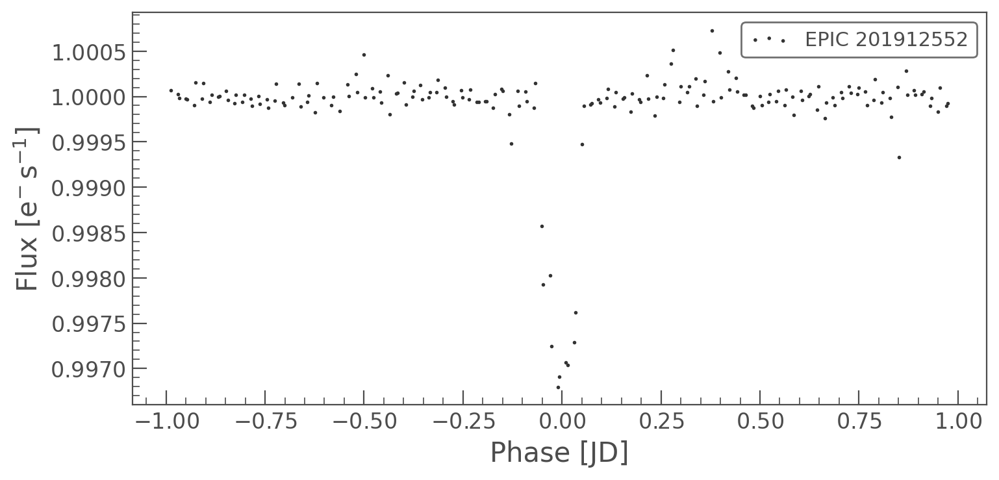

In [6]:
k = np.abs(((clc.time.value - (obs.t0 - 2454833 + obs.period/2))/obs.period) % 1 - 0.5) < 0.03
clc[k].fold(obs.period, obs.t0 - 2454833).scatter()

<AxesSubplot:xlabel='Phase [JD]', ylabel='Flux [$\\mathrm{e^{-}\\,s^{-1}}$]'>

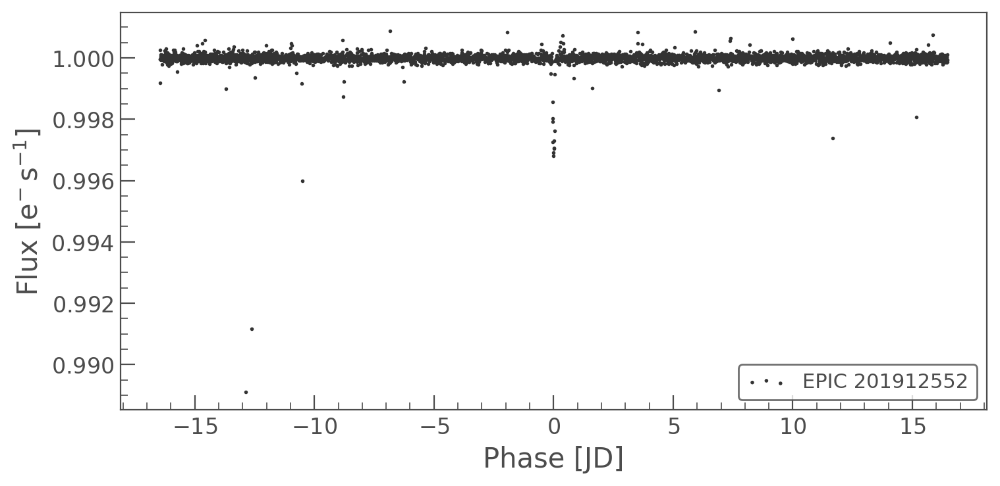

In [7]:
clc.fold(obs.period, obs.t0 - 2454833).scatter()

In [8]:
obs.fit_transit(x_suppl=clc.time.value[k] + 2454833,
                y_suppl=clc.flux.value[k],
                yerr_suppl=clc.flux_err.value[k],
                exptime_suppl=np.median(np.diff(clc.time.value)), fit_t0=True, fit_period=True, fit_inc=True)

<AxesSubplot:xlabel='Phase', ylabel='$e^-s^{-1}$'>

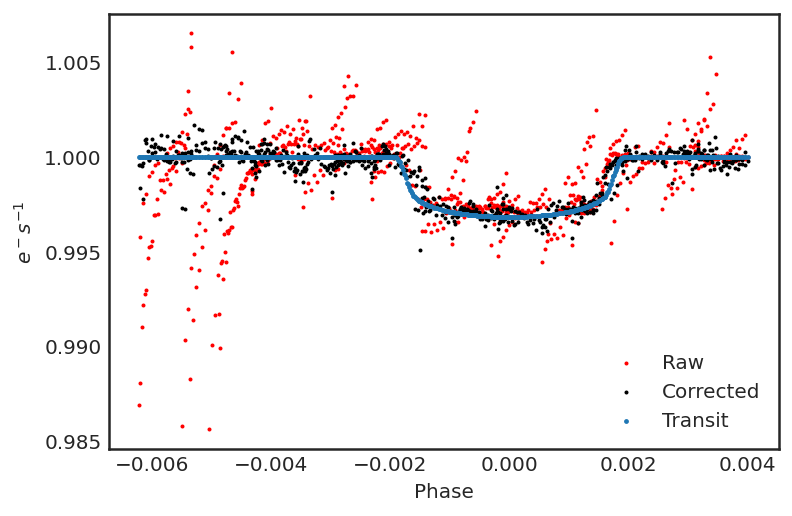

In [9]:
obs.plot()

In [10]:
obs.fit_model()

Fitting Transit/Eclipse Model:   0%|          | 0/16 [00:00<?, ?it/s]

Fitting Transit/Eclipse Model:   6%|▋         | 1/16 [00:18<04:34, 18.28s/it]

Fitting Transit/Eclipse Model:  12%|█▎        | 2/16 [00:37<04:24, 18.90s/it]

Fitting Transit/Eclipse Model:  19%|█▉        | 3/16 [00:54<03:55, 18.13s/it]

Fitting Transit/Eclipse Model:  25%|██▌       | 4/16 [01:09<03:18, 16.58s/it]

Fitting Transit/Eclipse Model:  31%|███▏      | 5/16 [01:26<03:05, 16.85s/it]

Fitting Transit/Eclipse Model:  38%|███▊      | 6/16 [01:42<02:44, 16.48s/it]

Fitting Transit/Eclipse Model:  44%|████▍     | 7/16 [01:58<02:27, 16.40s/it]

Fitting Transit/Eclipse Model:  50%|█████     | 8/16 [02:12<02:04, 15.54s/it]

Fitting Transit/Eclipse Model:  56%|█████▋    | 9/16 [02:26<01:47, 15.34s/it]

Fitting Transit/Eclipse Model:  62%|██████▎   | 10/16 [02:41<01:30, 15.03s/it]

Fitting Transit/Eclipse Model:  69%|██████▉   | 11/16 [02:55<01:13, 14.78s/it]

Fitting Transit/Eclipse Model:  75%|███████▌  | 12/16 [03:08<00:56, 14.20s/it]

Fitting Transit/Eclipse Model:  81%|████████▏ | 13/16 [03:22<00:42, 14.03s/it]

Fitting Transit/Eclipse Model:  88%|████████▊ | 14/16 [03:34<00:26, 13.46s/it]

Fitting Transit/Eclipse Model:  94%|█████████▍| 15/16 [03:46<00:13, 13.08s/it]

Fitting Transit/Eclipse Model: 100%|██████████| 16/16 [03:59<00:00, 13.03s/it]

Fitting Transit/Eclipse Model: 100%|██████████| 16/16 [03:59<00:00, 14.96s/it]

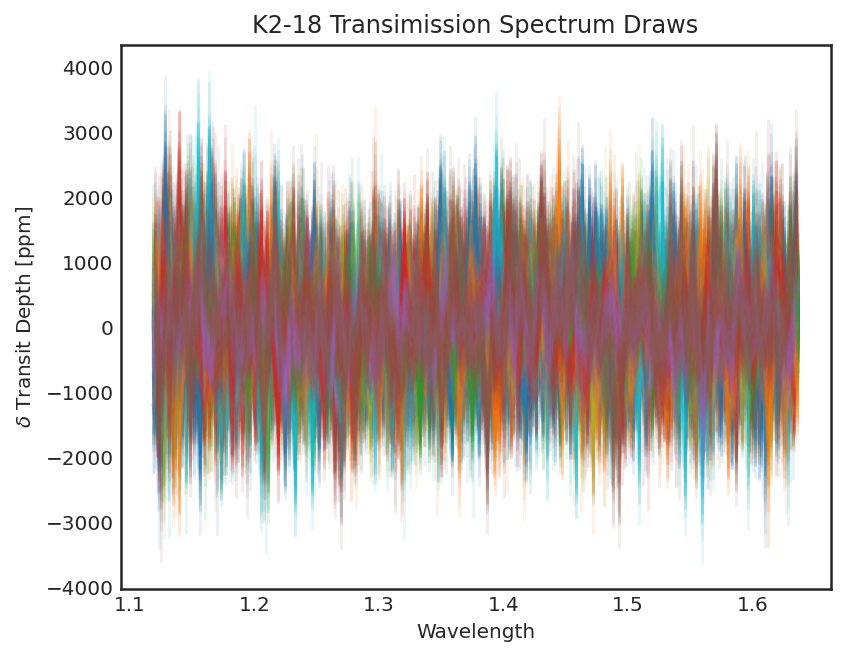

In [11]:
obs.plot_spectra()

<AxesSubplot:title={'center':'EPIC201912552 Transmission Spectrum, Visit: 1'}, xlabel='Wavelength', ylabel='$\\delta$ Transit Depth [ppm]'>

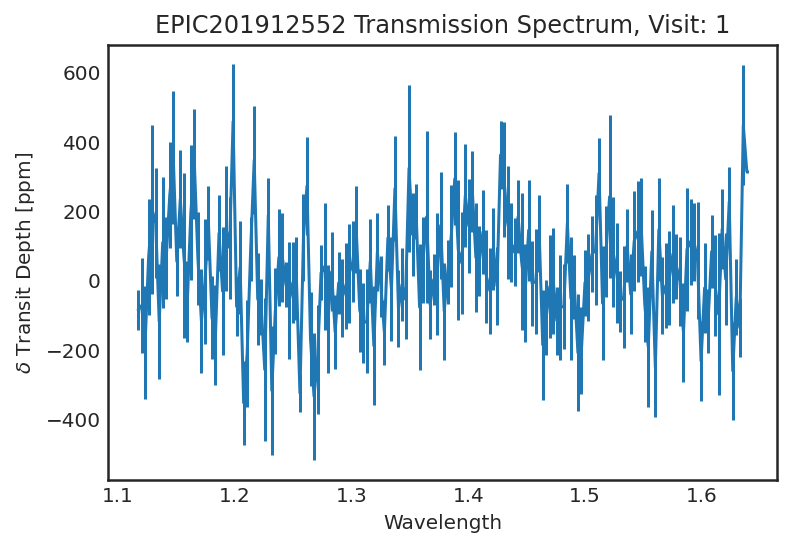

In [12]:
om.Spectra([visit.transmission_spectrum for visit in obs]).flatten().bin(bins=np.linspace(0.8, 1.7, 300)).plot()

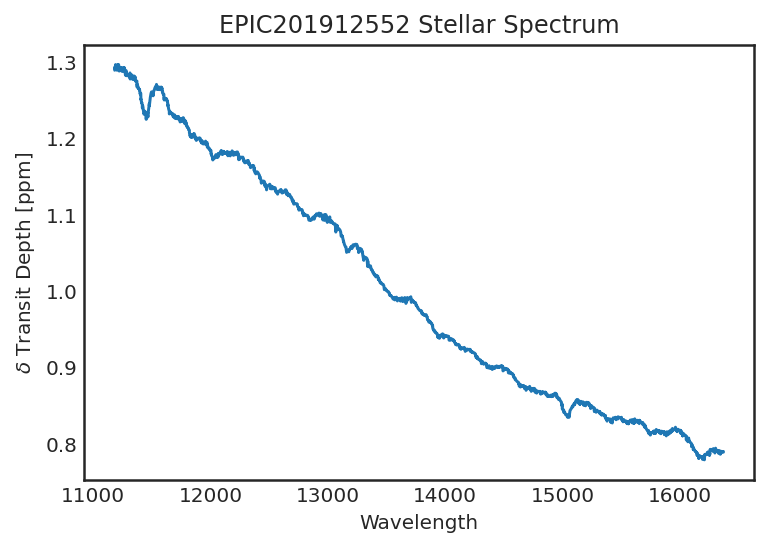

In [13]:
spec = obs.stellar_spectra
spec.plot()
spec.hdulist.writeto(f'results/{name}_stellar_spectrum.fits', overwrite=True)

In [14]:
from astropy.io import fits
try:
    hdulist = om.Spectra([visit.transmission_spectrum for visit in obs if visit.transmission_spectrum.spec.sum() != 0]).hdulist
    hdulist.writeto(f'results/{name}_transmission.fits', overwrite=True)
except:
    pass
try:    
    hdulist = om.Spectra([visit.emission_spectrum for visit in obs if visit.emission_spectrum.spec.sum() != 0]).hdulist
    hdulist.writeto(f'results/{name}_emission.fits', overwrite=True)
except:
    pass

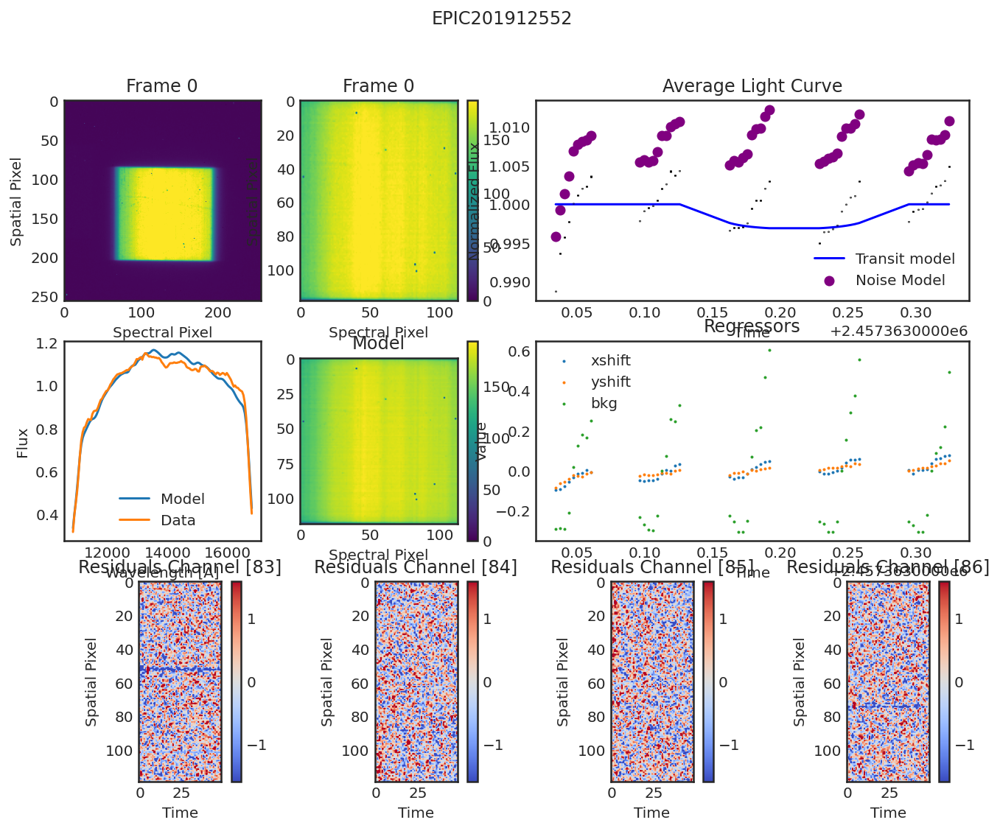

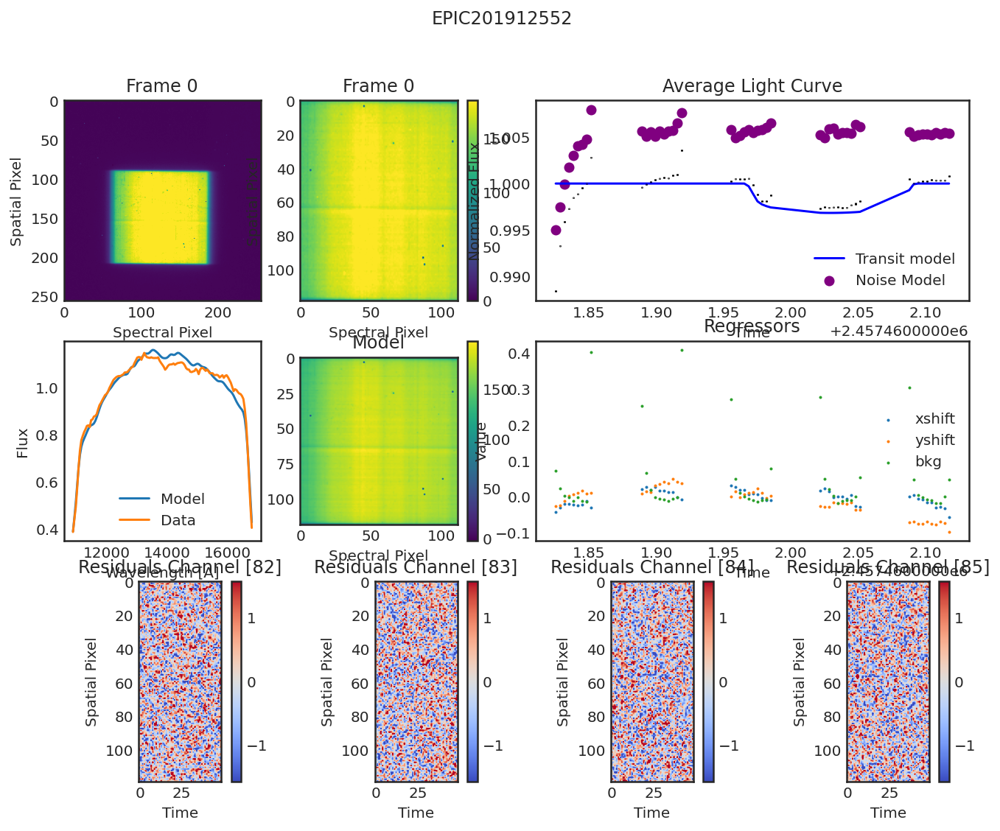

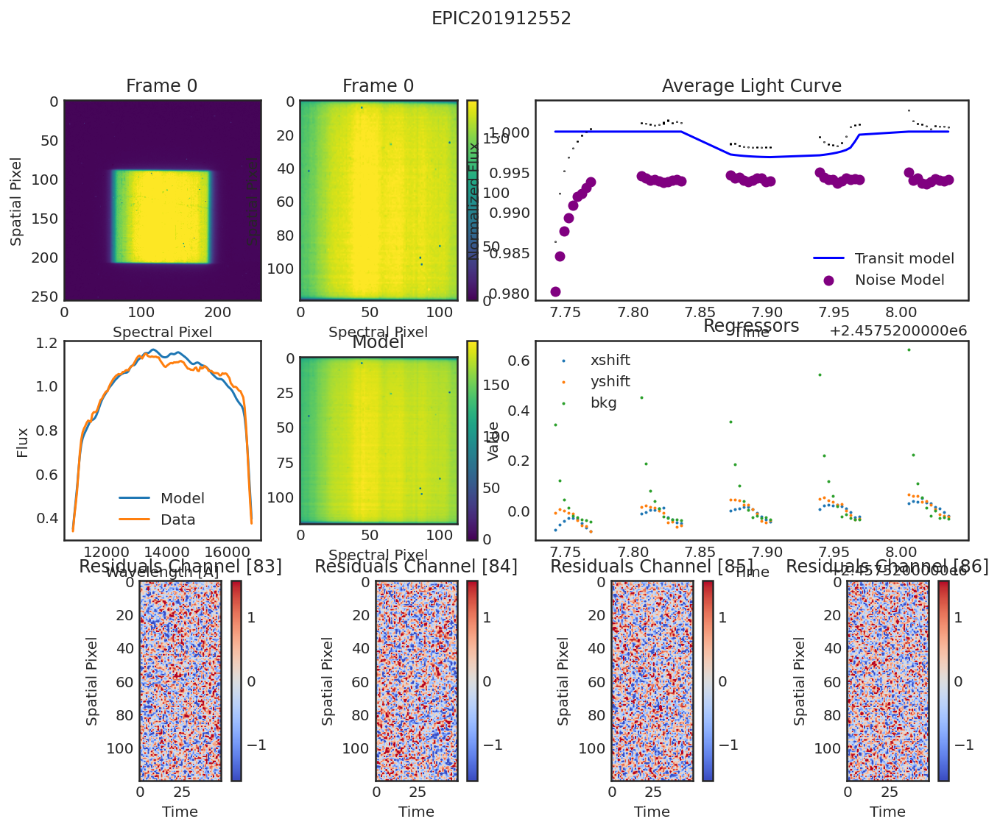

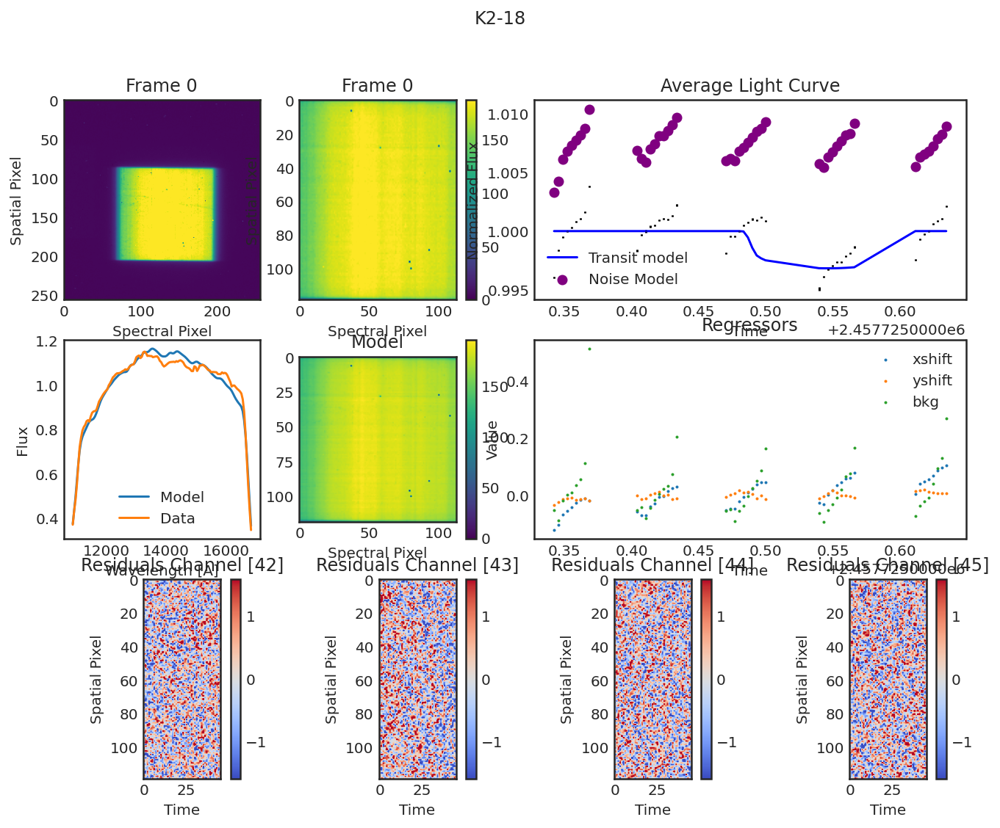

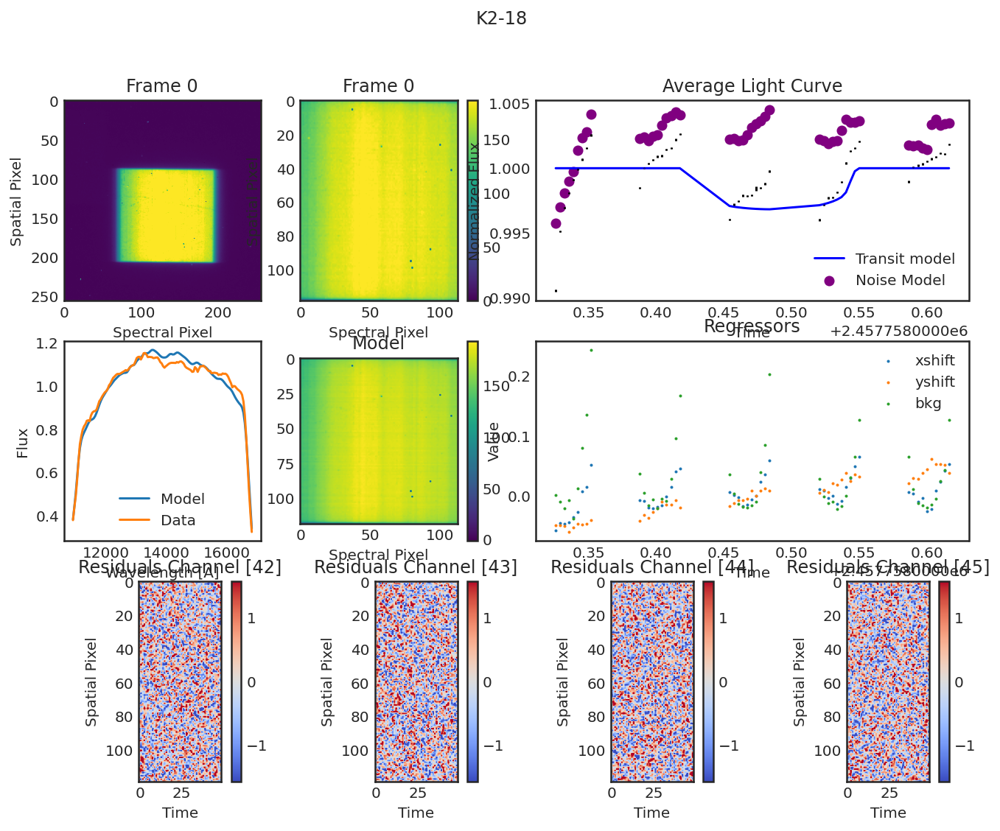

...

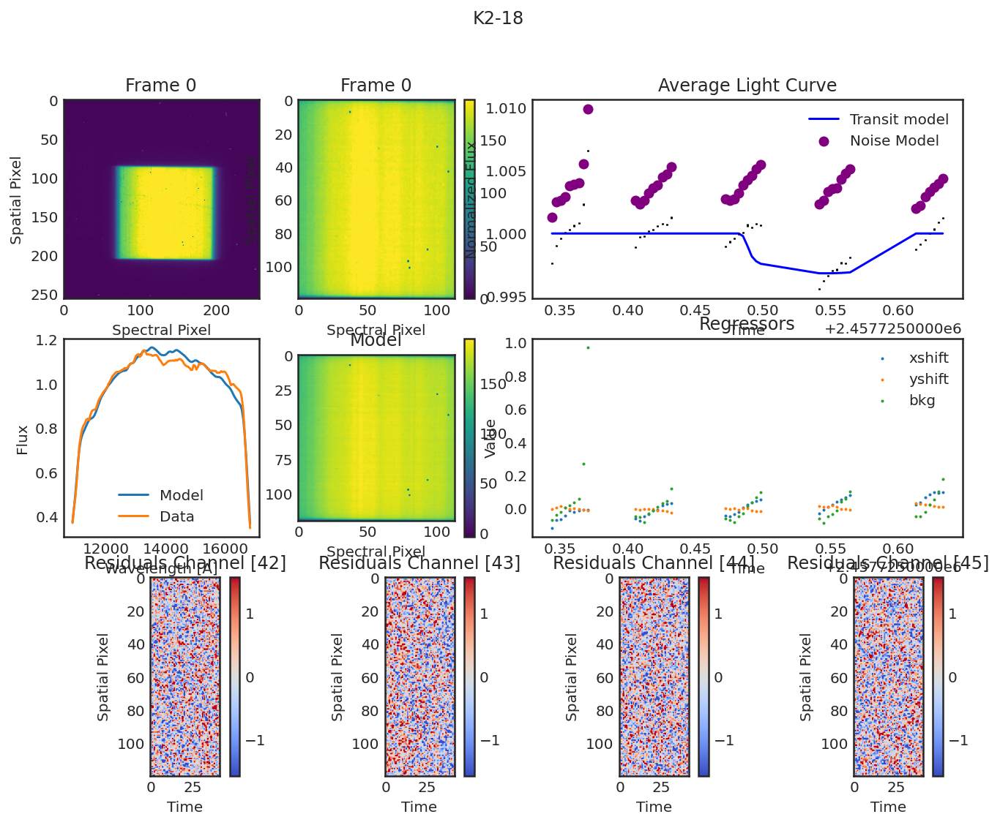

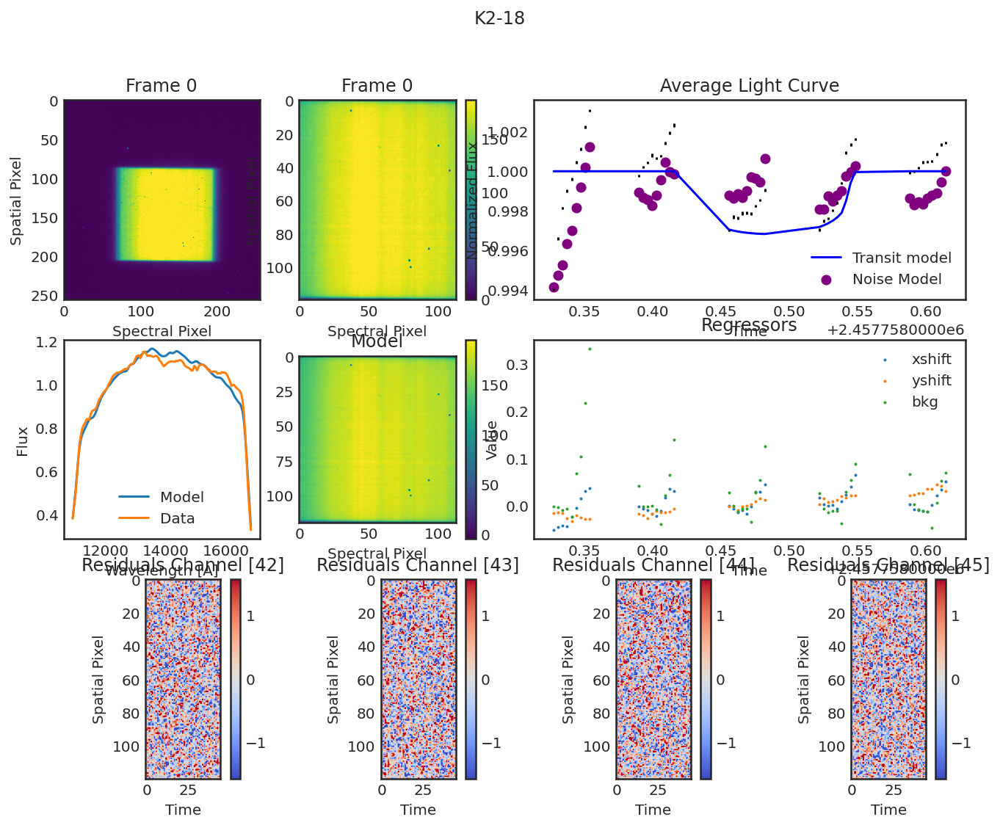

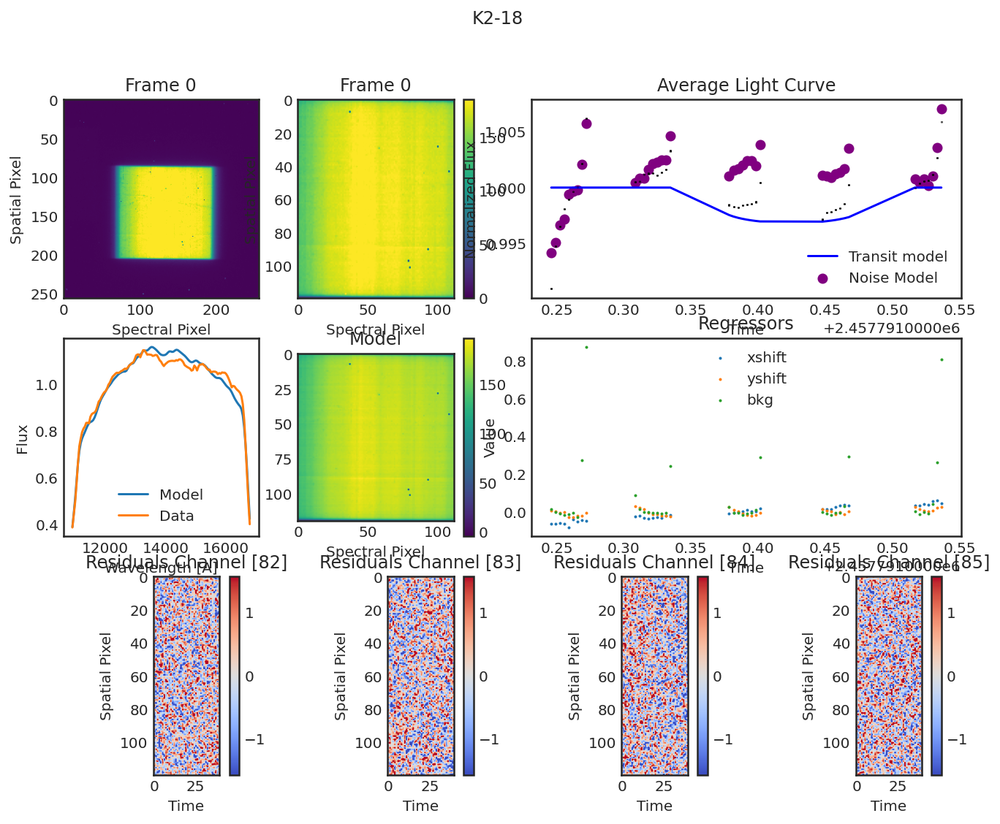

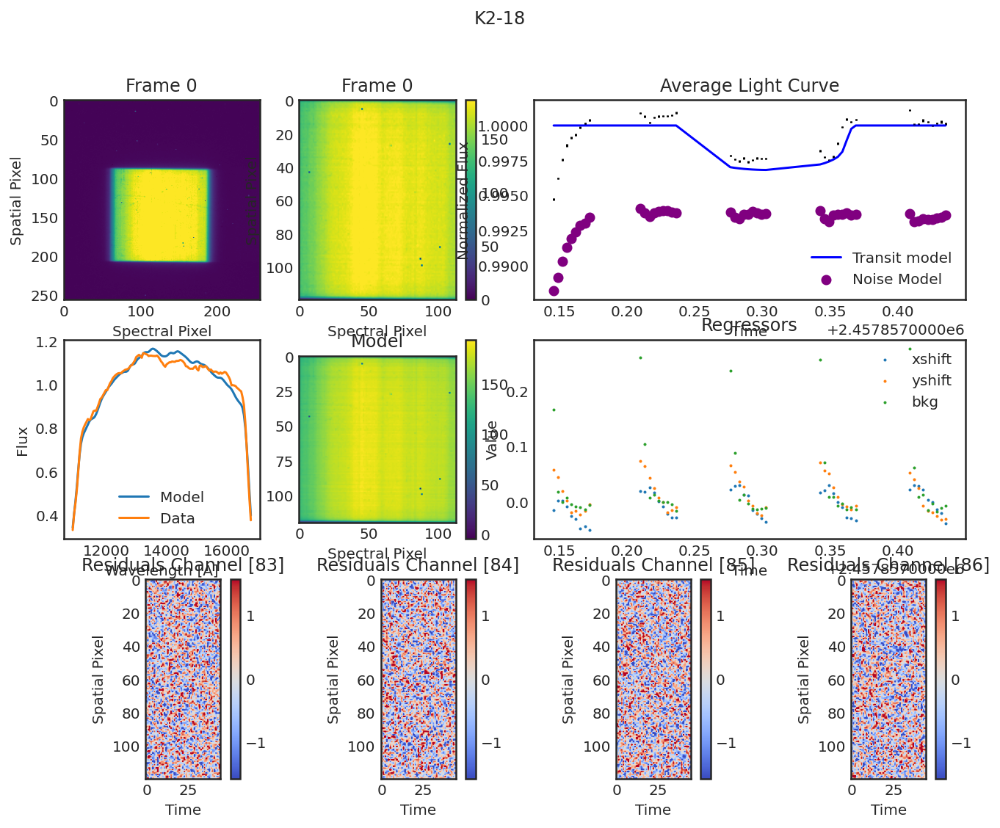

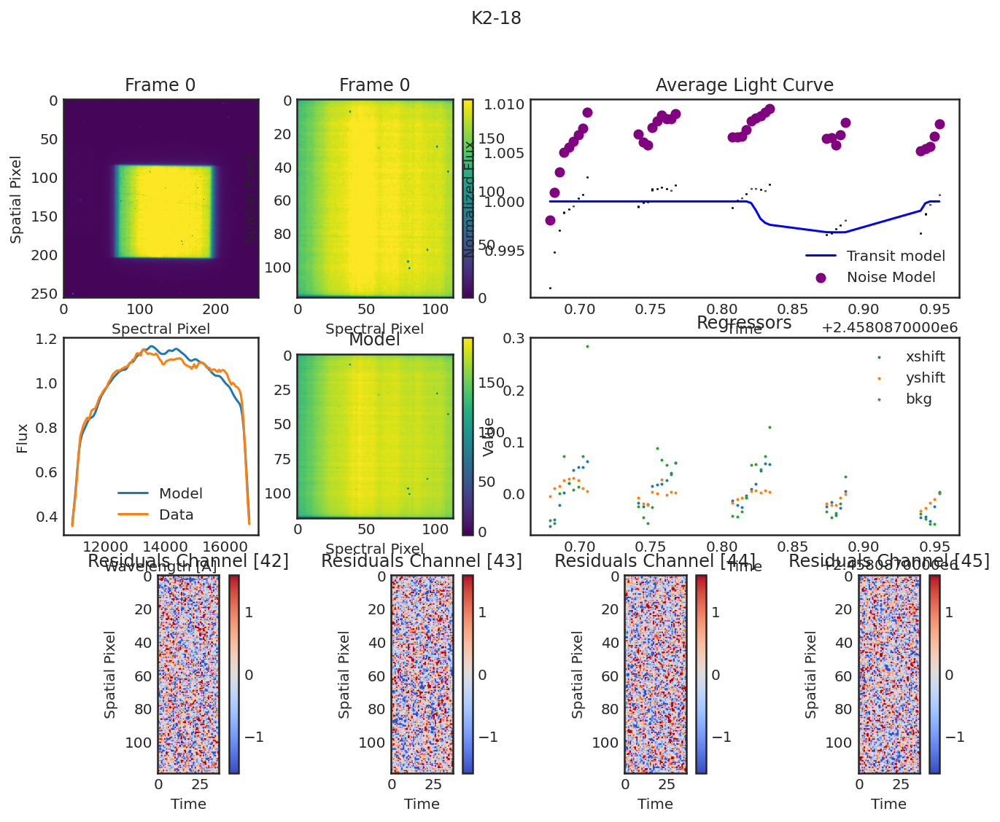

In [15]:
for visit in obs:
    visit.diagnose();
    plt.show();